************************************************************************************************************
* 题目：数据处理
* 制作者:版权所有,柳承睿、蒲鹏 Email:ppu@cc.ecnu.edu.cn；
* 最后更新日期：2022-6-1
* 补充掌握内容： https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.barabasi_albert_graph.html
https://rdrr.io/cran/PAFit/man/generate_BB.html
https://networkx.org/documentation/latest/auto_examples/drawing/plot_custom_node_icons.html
https://blog.csdn.net/m0_38139250/article/details/121877607
* scipy更多示例：https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.bernoulli.html  官方示例和JPT代码
* 声明：在转发并拷贝的过程中，请保留版权信息
************************************************************************************************************

该文件主要对数据进行处理

In [111]:
# %load "mylib\mysql_tool.py"

In [114]:
import numpy as np
import pandas as pd
#加载依赖库
import networkx as nx
from matplotlib import pyplot as plt

## 实验1 网络建模

### 子实验1 networkx对网络可视化

In [200]:
df_edges=pd.read_csv("edges.csv")
#df_edges=df_edges[:,1:5]
print(df_edges.head(2))
print("shape:",df_edges.shape)     # 太变态了，从EXCEL导入进来之后，原来的字符串都变成了数字类型

   Unnamed: 0     repo_i     repo_j  weight    date
0           0  100118847  136426082       0  201912
1           1  100118847  145183271       0  201912
shape: (14007, 5)


查看某个时间粒度的边，例如 201901

In [225]:
df_edges.date==201902
df_edges.date== '201901' #这个写法是错误的
df_edgesOneMonth=df_edges[df_edges.date==201902]
df_edgesOneMonth.head(5)

,Unnamed: 0,repo_i,repo_j,weight,date
12,12,100314903,100315083,0,201902
15,15,100314903,100315623,0,201902
19,19,100314903,100315853,0,201902
27,27,100314903,108311273,0,201902
32,32,100314903,119873047,0,201902


In [224]:
df_edgesOneMonth.shape

(1278, 5)

#### 步骤1 构造节点：获取仓库repo_i和repo_j两列中，出现过的repo_id.（去重）

In [220]:
def create_nodelist(df_edgesOneMonth):
    lii=list(df_edgesOneMonth.repo_i.unique())
    lij=list(df_edgesOneMonth.repo_j.unique())
    lij.extend(lii)
    lij=pd.Series(lij)
    nodes_list=list(lij.unique() ) #所有不重复的repo_id
    return nodes_list
    #print(repo_ids)

#### 步骤2 构造边：

In [218]:
def create_edgelist(df_edgesOneMonth):
    edge_list=[]
    for i in range(0,df_edgesOneMonth.shape[0]):
        dic={'weight':df_edgesOneMonth.iloc[i].weight}
        t=(df_edgesOneMonth.iloc[i].repo_i,df_edgesOneMonth.iloc[i].repo_j,dic) 
        edge_list.append(t)
    return edge_list
    #print(edge_list)

#### 步骤3 构造网络

In [260]:
#以某个日期作为参数构造，这个时期内的网络这样能够看到生长的过程
def create_network(date_str):
        #获取某个日期的网络数据
        repos_permonth=df_edges[df_edges.date==date_str]
        # 生成随机数据
        #G = nx.erdos_renyi_graph(50,0.5)
        # 生成新的图
        G_temp = nx.Graph()
        i = 0
        edge_list=create_edgelist(repos_permonth)
        for edge in edge_list:
                i += 1
                #G_temp.add_weighted_edges_from([(edge[0], edge[1], edge[2])])
                #G_temp.add_weighted_edges_from(tuple(edge))
                G_temp.add_edges_from([(edge[0], edge[1], edge[2])])
        return G_temp

#### 步骤3 可视化

简单可视化网络拓扑
https://networkx.org/documentation/latest/auto_examples/drawing/plot_ego_graph.html

In [280]:
def draw_network_basic(G,title="null"):
    # 指定画布大小
    #plt.title(title)
    plt.figure(figsize=(18,18))
    # 将生成的随机权重复制给G_new图
    # 绘制G_new图
    pos = nx.spring_layout(G, seed=3068)  # Seed layout for reproducibility
    nx.draw_networkx(G,pos)
    # pos = nx.graphviz_layout(G, prog="dot") 
    # nx.draw_networkx_nodes(G, pos, node_size=900, node_color="w") 
    # nx.draw_networkx_edges(G, pos) 
   
    #nx.draw_networkx_labels(G, pos, labels) 
    plt.axis("off") 

度也可视化出来

In [282]:
def draw_network_degree(G):
    degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
    dmax = max(degree_sequence)
    fig = plt.figure("Degree of a random graph", figsize=(8, 8))
    # Create a gridspec for adding subplots of different sizes
    axgrid = fig.add_gridspec(5, 4)
    ax0 = fig.add_subplot(axgrid[0:3, :])
    Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
    pos = nx.spring_layout(Gcc, seed=10396953)
    nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=20)
    nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.4)
    ax0.set_title("Connected components of G")
    ax0.set_axis_off()
    ax1 = fig.add_subplot(axgrid[3:, :2])
    ax1.plot(degree_sequence, "b-", marker="o")
    ax1.set_title("Degree Rank Plot")
    ax1.set_ylabel("Degree")
    ax1.set_xlabel("Rank")
    ax2 = fig.add_subplot(axgrid[3:, 2:])
    ax2.bar(*np.unique(degree_sequence, return_counts=True))
    ax2.set_title("Degree histogram")
    ax2.set_xlabel("Degree")
    ax2.set_ylabel("# of Nodes")
    fig.tight_layout()

测试

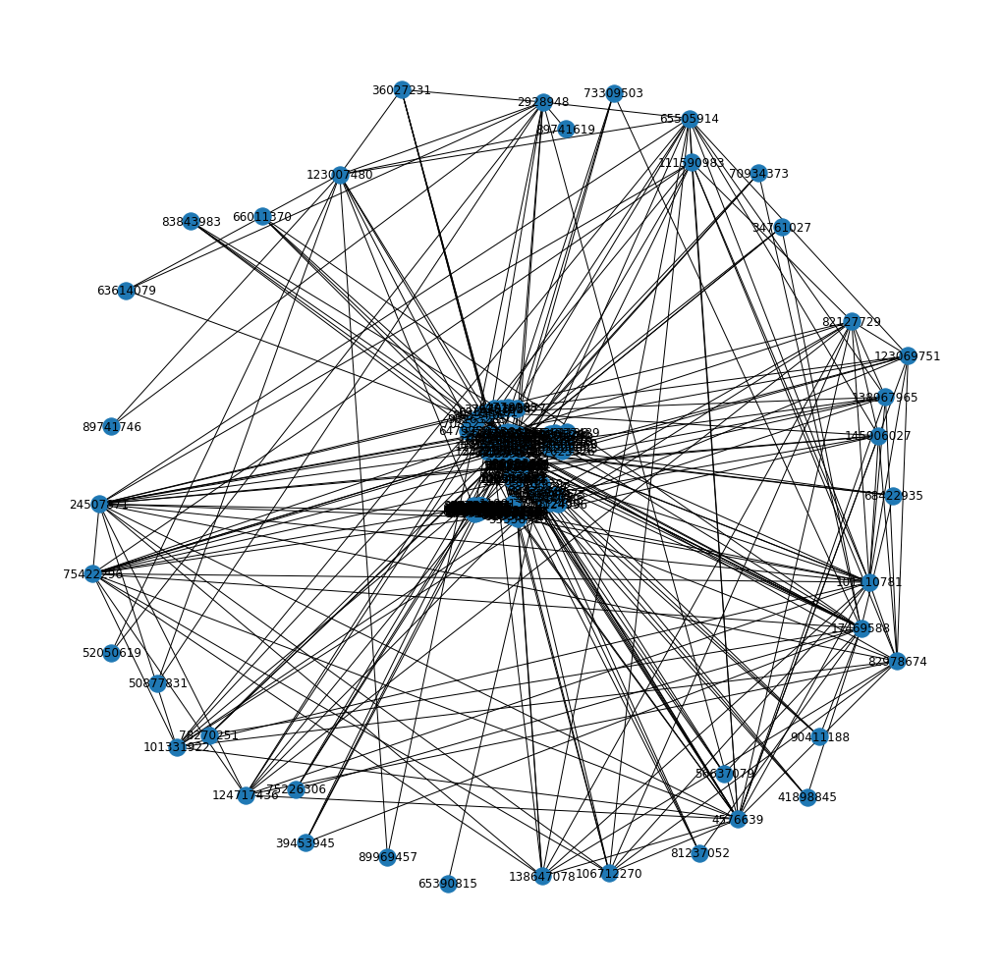

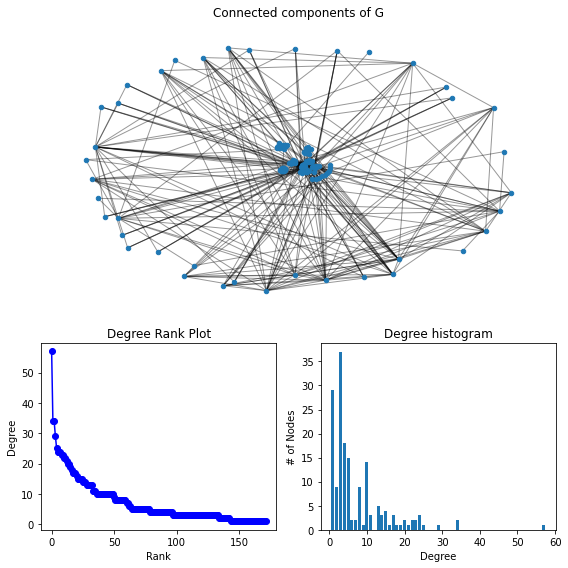

In [283]:
G_github=create_network(201901)
draw_network_basic(G_github)
draw_network_degree(G_github)

#### 步骤4 以5S为间隔，演示GITHUB网络演化

201901
201902
201903
201904
201905
201906
201907
201908
201909
201910
201911
201912


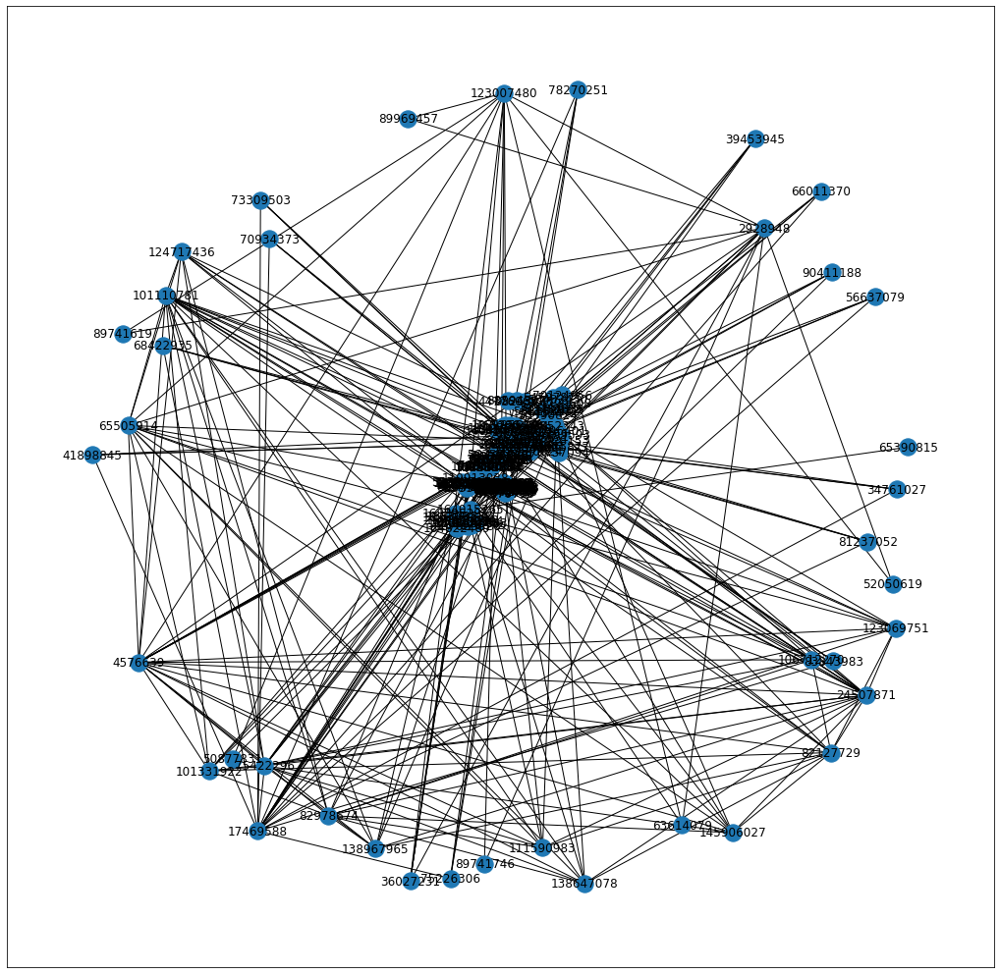

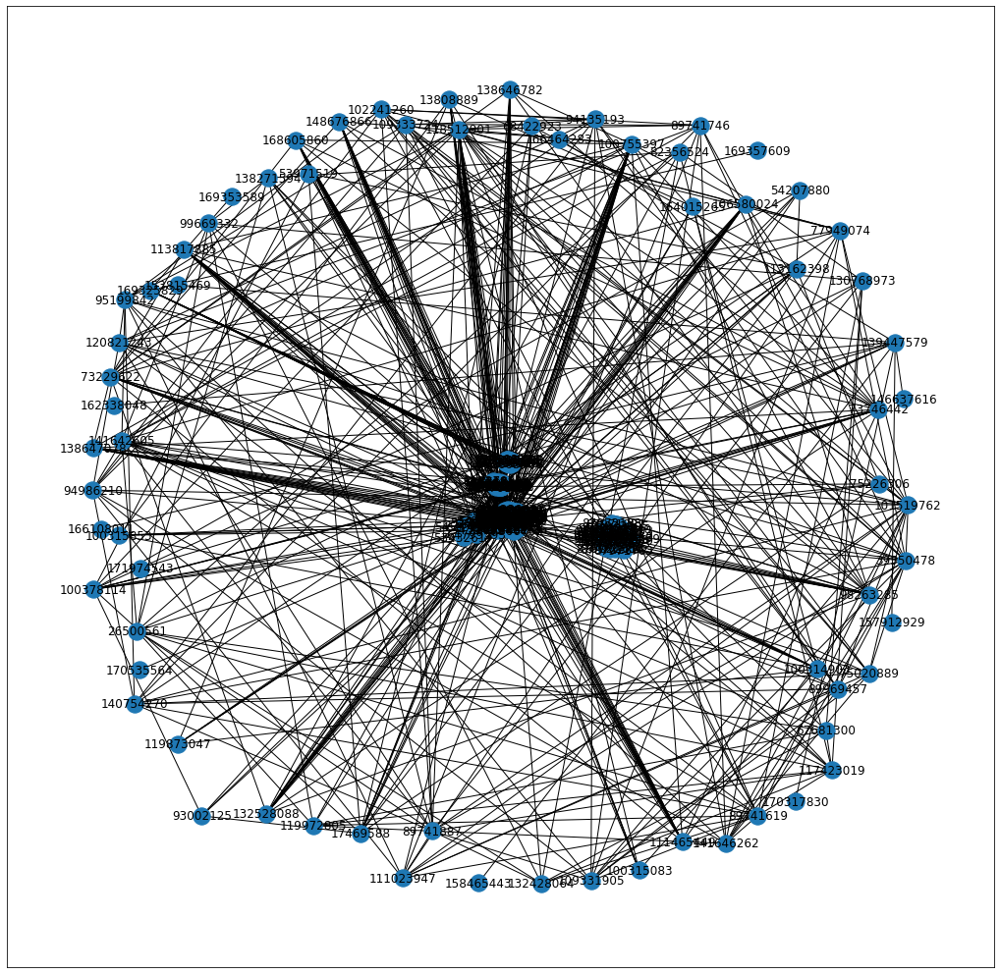

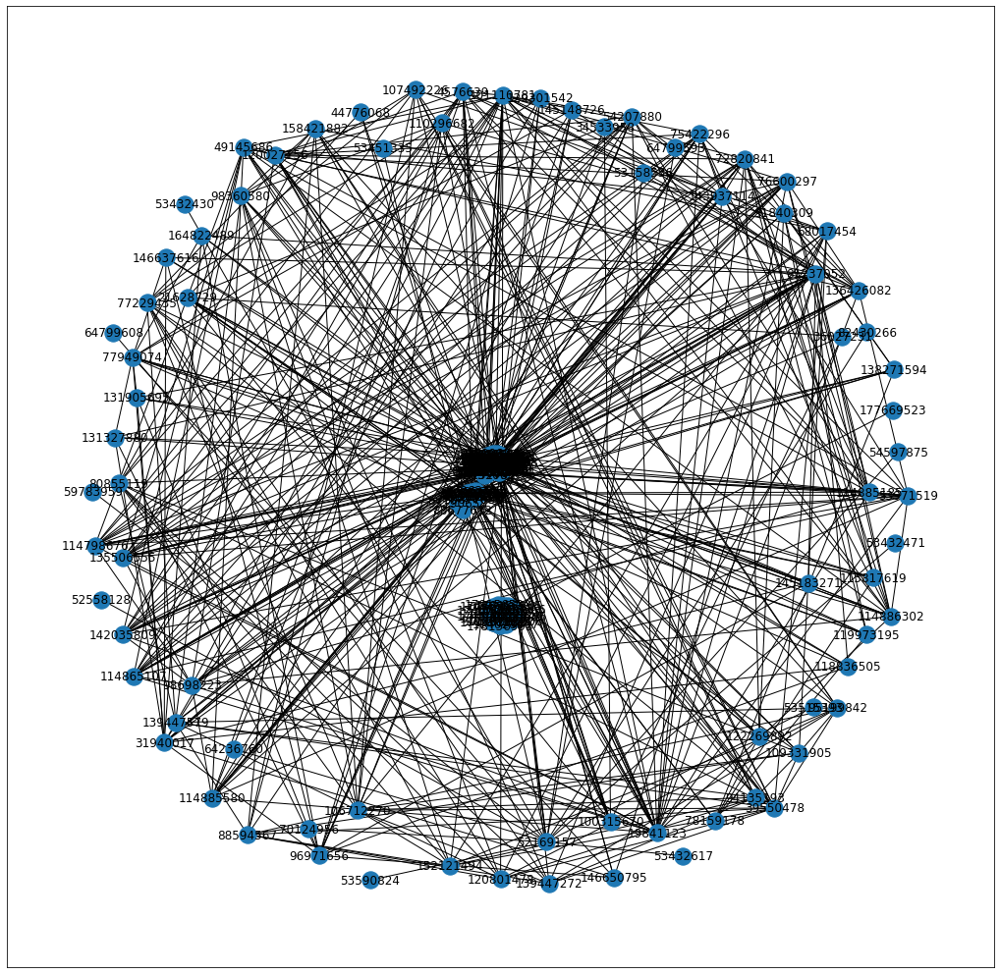

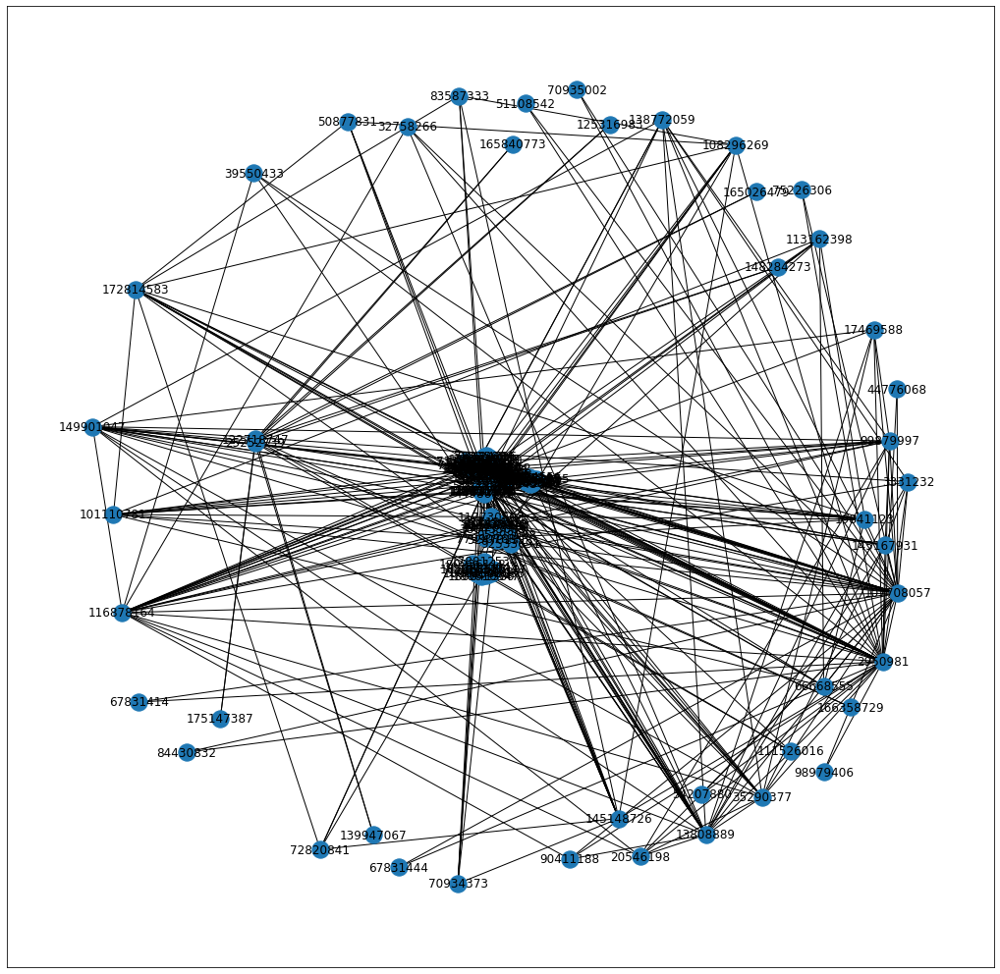

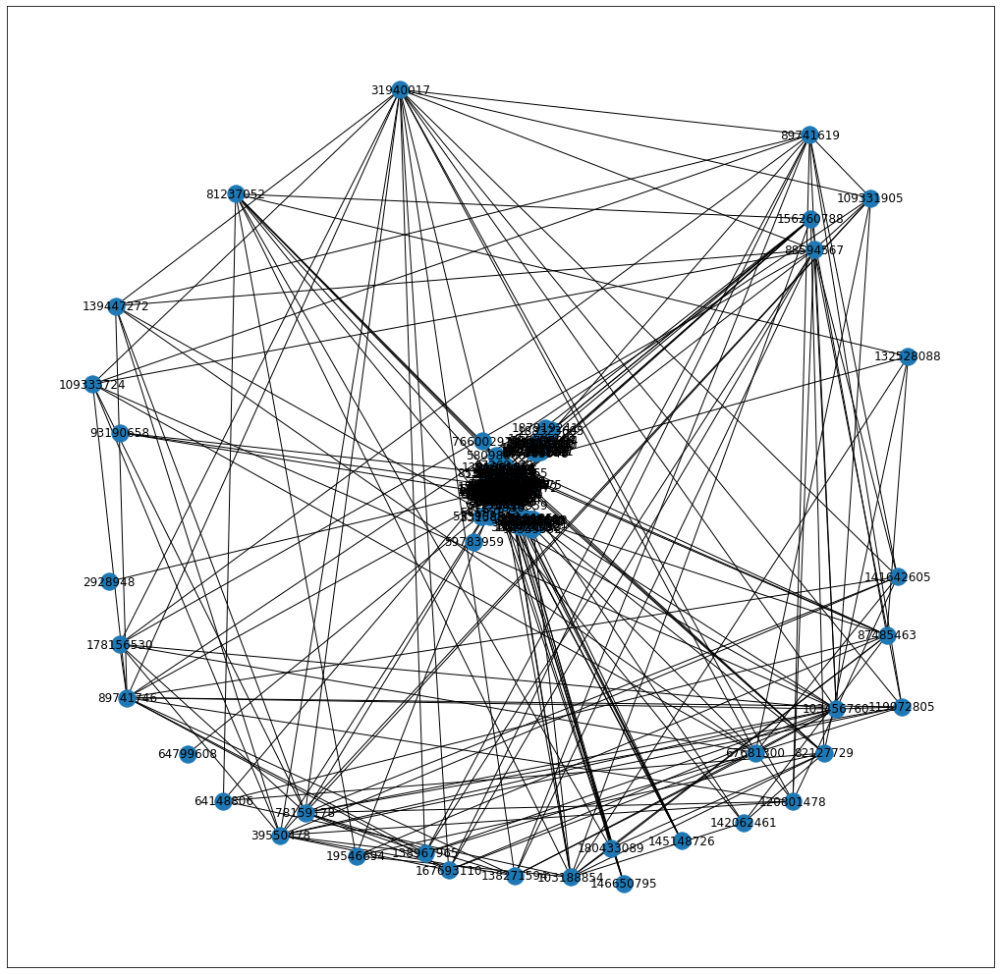

...

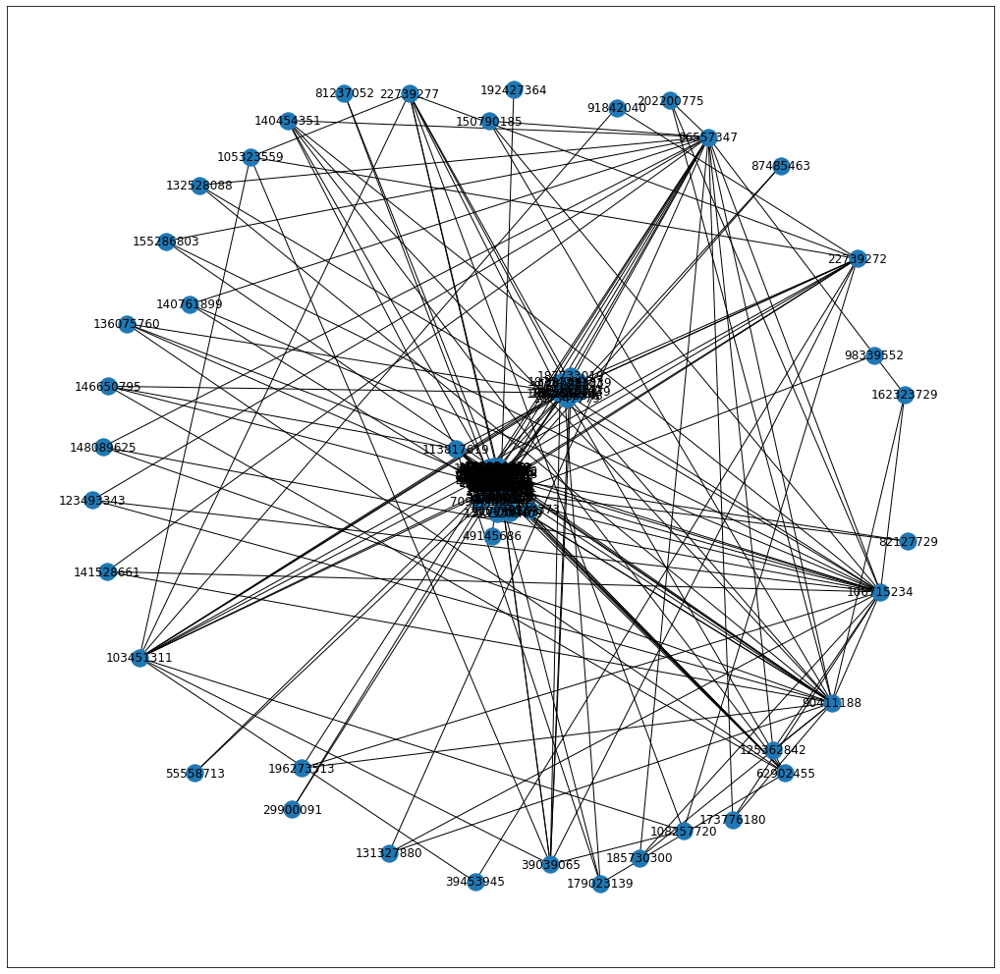

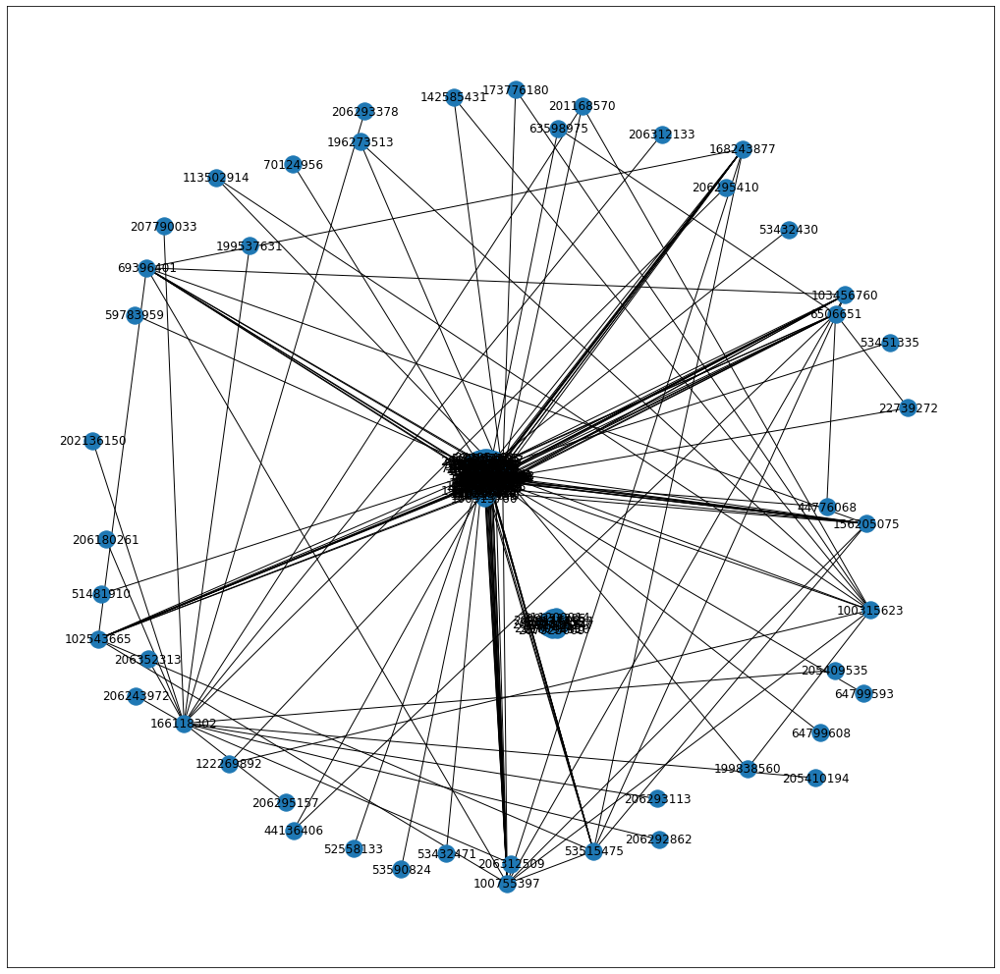

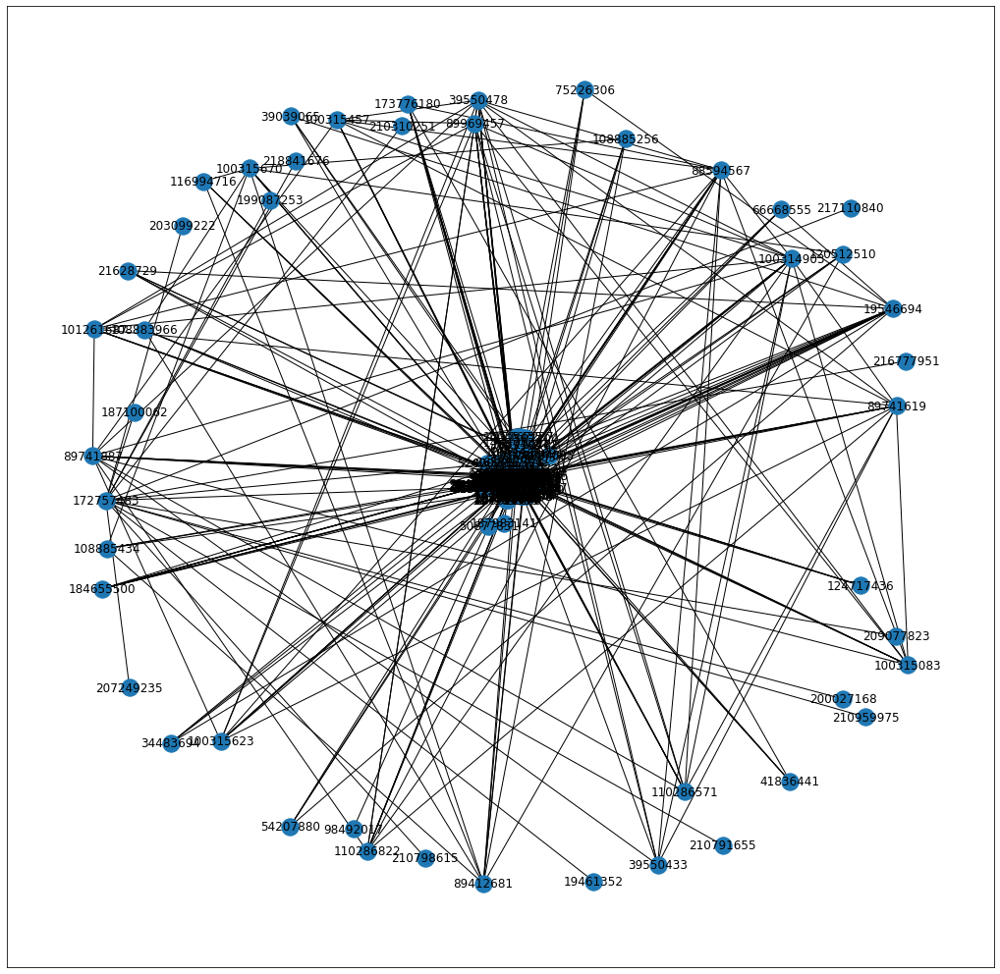

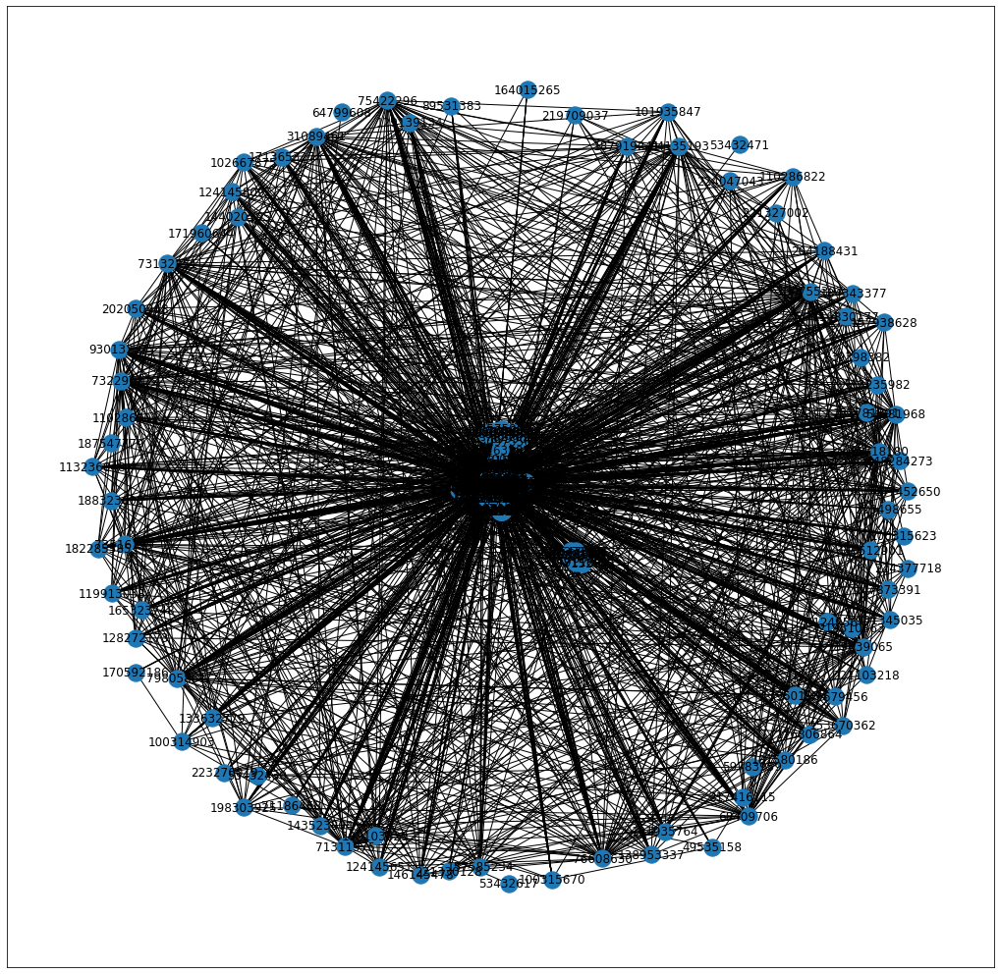

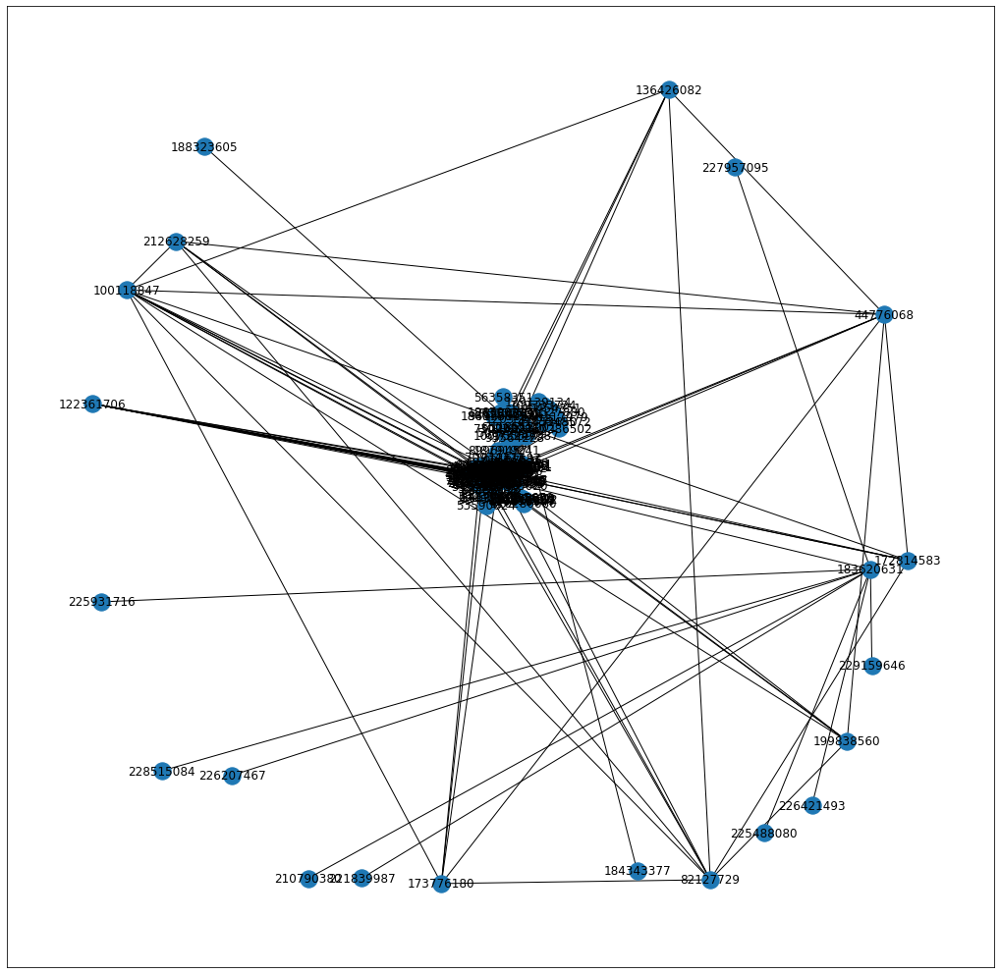

In [247]:
import time
timp_stam=3 #单位秒
date_list=list(df_edges.date.unique())
date_list.sort()
for tdate in date_list:
    print(tdate)
    time.sleep(timp_stam)
    G_github=create_network(tdate)
    draw_network1(G_github)

### 子实验2 度分布

步骤1 度的计算

In [268]:
G_github=create_network(201901)

In [ ]:
#print (G_github.degree(0))                                 #返回某个节点的度
print ("所有节点的度",G_github.degree() )                                    #返回所有节点的度
print ("所有节点的度分布序列:",nx.degree_histogram(G_github))    #返回图中所有节点的度分布序列（从1至最大度的出现频次）

In [272]:
G_github_d = nx.degree(G_github)
#print(G_github_d)
d_df=pd.DataFrame(G_github_d,columns=['repo_id','degree'])

In [252]:
d_df.head(5)

,repo_id,degree
0,100315853,9
1,100316137,10
2,101261687,3
3,101935764,3
4,101935847,3


步骤2 度分布的可视化

(array([110.,  29.,  16.,   9.,   4.,   3.,   0.,   0.,   0.,   1.]),
 array([ 1. ,  6.6, 12.2, 17.8, 23.4, 29. , 34.6, 40.2, 45.8, 51.4, 57. ]),
 <BarContainer object of 10 artists>)

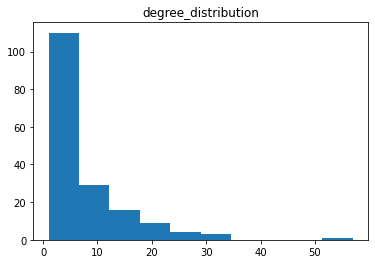

In [253]:
plt.title("degree_distribution")
plt.hist(d_df['degree'])

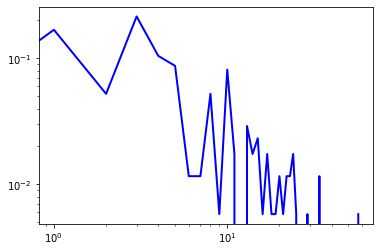

In [273]:
import matplotlib.pyplot as plt                 #导入科学绘图的matplotlib包
degree =  nx.degree_histogram(G_github)          #返回图中所有节点的度分布序列
x = range(len(degree))                             #生成x轴序列，从1到最大度
y = [z / float(sum(degree)) for z in degree]  
#将频次转换为频率，这用到Python的一个小技巧：列表内涵，Python的确很方便：）
plt.loglog(x,y,color="blue",linewidth=2)           #在双对数坐标轴上绘制度分布曲线  
plt.show()                                                          #显示图表

### 步骤3 度分布的演化（以月为粒度）